In [1]:
import pandas as pd

In [86]:
shop_sales = pd.read_csv('../data/raw/shop_sales.csv')
shop_sales_dates = pd.read_csv('../data/raw/shop_sales_dates.csv')
shop_sales_prices = pd.read_csv('../data/raw/shop_sales_prices.csv')


In [87]:
merged_sales_dates = pd.merge(shop_sales, shop_sales_dates, on='date_id', how='left')
final_merged_data = pd.merge(merged_sales_dates, shop_sales_prices, on=['store_id', 'item_id', 'wm_yr_wk'], how='left')

In [88]:
final_merged_data.head()

,item_id,store_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,CASHBACK_STORE_1,CASHBACK_STORE_2,CASHBACK_STORE_3,sell_price
0,STORE_2_085,STORE_2,1,3,2011-01-29,11101,Saturday,1,1,2011,NaN,NaN,NaN,NaN,0,0,0,1.0
1,STORE_2_085,STORE_2,2,8,2011-01-30,11101,Sunday,2,1,2011,NaN,NaN,NaN,NaN,0,0,0,1.0
2,STORE_2_085,STORE_2,3,0,2011-01-31,11101,Monday,3,1,2011,NaN,NaN,NaN,NaN,0,0,0,1.0
3,STORE_2_085,STORE_2,4,3,2011-02-01,11101,Tuesday,4,2,2011,NaN,NaN,NaN,NaN,0,1,1,1.0
4,STORE_2_085,STORE_2,5,0,2011-02-02,11101,Wednesday,5,2,2011,NaN,NaN,NaN,NaN,1,1,0,1.0


In [94]:
data = final_merged_data.copy()

In [6]:
from sklearn.preprocessing import LabelEncoder

In [95]:
data['event_name_1'].fillna('0', inplace=True)
data['event_type_1'].fillna('0', inplace=True)
data['event_name_2'].fillna('0', inplace=True)
data['event_type_2'].fillna('0', inplace=True)

label_encoder_event_name_1 = LabelEncoder()
label_encoder_event_type_1 = LabelEncoder()
label_encoder_event_name_2 = LabelEncoder()
label_encoder_event_type_2 = LabelEncoder()

data['event_name_1_encoded'] = label_encoder_event_name_1.fit_transform(data['event_name_1'])
data['event_type_1_encoded'] = label_encoder_event_type_1.fit_transform(data['event_type_1'])
data['event_name_2_encoded'] = label_encoder_event_name_2.fit_transform(data['event_name_2'])
data['event_type_2_encoded'] = label_encoder_event_type_2.fit_transform(data['event_type_2'])

In [35]:
# data[['event_name_1', 'event_type_1', 'event_name_1_encoded', 'event_type_1_encoded']]
data

,item_id,store_id,date_id,cnt,date,wm_yr_wk,weekday,wday,month,year,...,event_name_2,event_type_2,CASHBACK_STORE_1,CASHBACK_STORE_2,CASHBACK_STORE_3,sell_price,event_name_1_encoded,event_type_1_encoded,event_name_2_encoded,event_type_2_encoded
0,STORE_2_085,STORE_2,1,3,2011-01-29,11101,Saturday,1,1,2011,...,0,0,0,0,0,1.00,0,0,0,0
1,STORE_2_085,STORE_2,2,8,2011-01-30,11101,Sunday,2,1,2011,...,0,0,0,0,0,1.00,0,0,0,0
2,STORE_2_085,STORE_2,3,0,2011-01-31,11101,Monday,3,1,2011,...,0,0,0,0,0,1.00,0,0,0,0
3,STORE_2_085,STORE_2,4,3,2011-02-01,11101,Tuesday,4,2,2011,...,0,0,0,1,1,1.00,0,0,0,0
4,STORE_2_085,STORE_2,5,0,2011-02-02,11101,Wednesday,5,2,2011,...,0,0,1,1,0,1.00,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81850,STORE_1_727,STORE_1,1815,2,2016-01-17,11551,Sunday,2,1,2016,...,0,0,0,0,0,4.48,0,0,0,0
81851,STORE_1_727,STORE_1,1816,3,2016-01-18,11551,Monday,3,1,2016,...,0,0,0,0,0,4.48,14,2,0,0
81852,STORE_1_727,STORE_1,1817,1,2016-01-19,11551,Tuesday,4,1,2016,...,0,0,0,0,0,4.48,0,0,0,0
81853,STORE_1_727,STORE_1,1818,4,2016-01-20,11551,Wednesday,5,1,2016,...,0,0,0,0,0,4.48,0,0,0,0


In [9]:
from etna.datasets.tsdataset import TSDataset
from etna.transforms import LagTransform
from etna.transforms import LinearTrendTransform

c:\Users\saifu\AppData\Local\pypoetry\Cache\virtualenvs\dfu-automl-33GLpTph-py3.10\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [96]:
data['timestamp'] = pd.to_datetime(data['date'])
data['segment'] = data['item_id']
data['target'] = data['cnt']

In [92]:
data.set_index(['timestamp', 'segment'], inplace=True)

In [97]:
ts = TSDataset(data, freq="D")

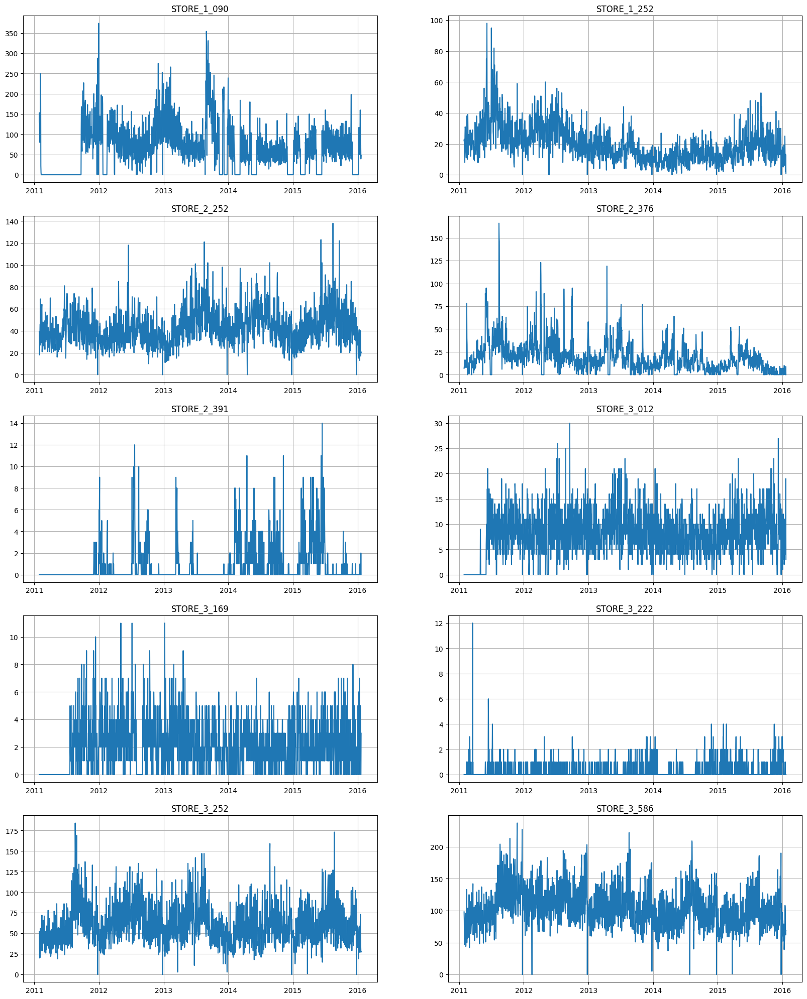

In [39]:
ts.plot()

In [21]:
from etna.analysis import acf_plot
from etna.analysis import cross_corr_plot
from etna.analysis import distribution_plot
from etna.analysis import plot_correlation_matrix

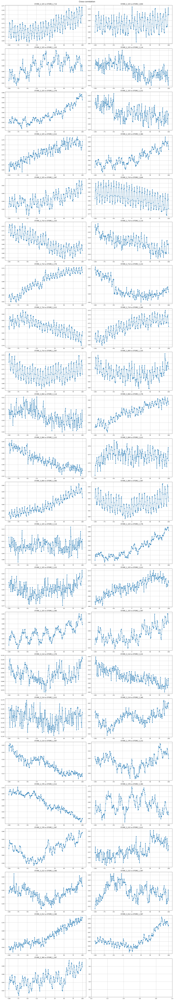

In [24]:
# acf_plot(ts, lags=21, partial=True)
cross_corr_plot(ts, maxlags=100)

In [32]:
from etna.analysis import get_anomalies_density
from etna.analysis import get_anomalies_median
from etna.analysis import plot_anomalies

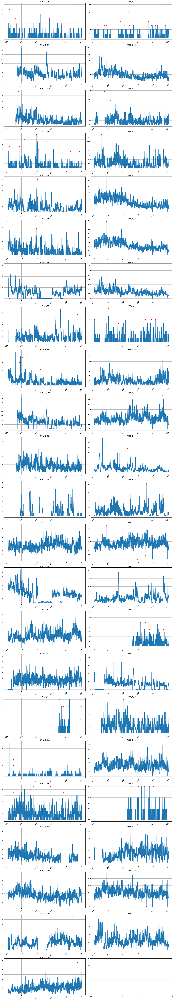

In [33]:
anomaly_dict = get_anomalies_density(ts)
plot_anomalies(ts, anomaly_dict)

In [34]:
from ruptures.detection import Binseg

from etna.analysis import find_change_points
from etna.analysis import plot_change_points_interactive
from etna.analysis import plot_time_series_with_change_points

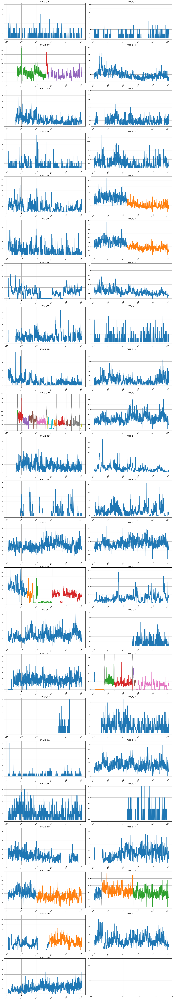

In [35]:
change_points = find_change_points(ts=ts, in_column="target", change_point_model=Binseg(), pen=1e5)
plot_time_series_with_change_points(ts=ts, change_points=change_points)

In [128]:
from etna.models import (
    AutoARIMAModel,
    ProphetModel,
    SARIMAXModel,
    CatBoostMultiSegmentModel,
    LinearPerSegmentModel,
    ElasticMultiSegmentModel,
    HoltModel,
    SeasonalMovingAverageModel
)
from etna.pipeline import Pipeline

In [129]:
pipeline = Pipeline(model=SeasonalMovingAverageModel(), horizon=7)

In [131]:
train_ts, test_ts = ts.train_test_split(test_size=7)
pipeline.fit(train_ts)
forecast_ts = pipeline.forecast(prediction_interval=True)

CatBoostError: Bad value for num_feature[non_default_doc_idx=0,feature_idx=4]="2011-01-29": Cannot convert 'b'2011-01-29'' to float

In [123]:
from etna.metrics import SMAPE

smape = SMAPE()
smape(y_true=test_ts, y_pred=forecast_ts)

{'STORE_1_064': 187.5893984351191,
 'STORE_1_065': 118.98933856315637,
 'STORE_1_090': 29.4869386197345,
 'STORE_1_252': 67.69146784546365,
 'STORE_1_325': 51.59163519115288,
 'STORE_1_339': 87.31646174479813,
 'STORE_1_376': 173.50901916697683,
 'STORE_1_546': 54.83467187973623,
 'STORE_1_547': 48.657687733327066,
 'STORE_1_555': 22.251900387275683,
 'STORE_1_584': 84.05856533136001,
 'STORE_1_586': 14.798946754963419,
 'STORE_1_587': 14.5649767537745,
 'STORE_1_714': 17.1092051325854,
 'STORE_1_727': 56.43066734034367,
 'STORE_2_043': 153.83778413034946,
 'STORE_2_054': 52.274415974274035,
 'STORE_2_085': 70.93798598028151,
 'STORE_2_090': 13.971425193516037,
 'STORE_2_252': 31.0237751582084,
 'STORE_2_325': 30.62053189519031,
 'STORE_2_376': 101.6359512087695,
 'STORE_2_391': 194.22099742538896,
 'STORE_2_524': 71.99986031767548,
 'STORE_2_555': 12.395096515656894,
 'STORE_2_586': 9.954222988320057,
 'STORE_2_587': 53.33519068506014,
 'STORE_2_681': 19.48738652987832,
 'STORE_2_714'

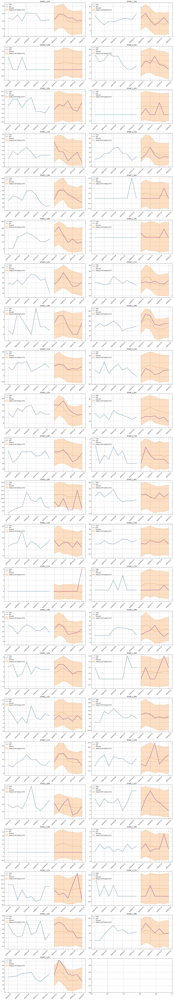

In [125]:
from etna.analysis import plot_forecast

plot_forecast(forecast_ts=forecast_ts, test_ts=test_ts, train_ts=train_ts, n_train_samples=10, prediction_intervals=True)